# Computer Vision Project -Vikram Suriyanarayanan

# PART-1

In [1]:
import pandas as pd
import numpy as np

import os
import cv2
import matplotlib.pyplot as plt
import seaborn as sns

import tensorflow as tf
from tensorflow import keras
from IPython.display import SVG
from sklearn.metrics import accuracy_score

In [2]:
%tensorflow_version 2.x
import tensorflow
tensorflow.__version__

UsageError: Line magic function `%tensorflow_version` not found.


In [6]:
import tensorflow
from tensorflow.keras.utils import model_to_dot
from tensorflow.keras.utils import plot_model
from sklearn.metrics import confusion_matrix
from sklearn.model_selection import train_test_split
from tensorflow.keras.utils import to_categorical

from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.optimizers import Adam,SGD
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping
from tensorflow.keras.layers import Input, Add, Dense, Activation, ZeroPadding2D, BatchNormalization, Flatten, Conv2D, AveragePooling2D, MaxPooling2D, GlobalMaxPooling2D, Dropout
#from tensorflow.keras.models import Sequential, Model, Input

from tensorflow.keras.initializers import *

In [7]:
# Initialize the random number generator
import random
random.seed(0)

# Ignore the warnings
import warnings
warnings.filterwarnings("ignore")

In [8]:
class_names = ['Black-grass', 'Charlock', 'Cleavers', 'Common Chickweed', 'Common wheat', 'Fat Hen',
              'Loose Silky-bent', 'Maize', 'Scentless Mayweed', 'Shepherds Purse',
              'Small-flowered Cranesbill', 'Sugar beet']

class_name_labels={class_name:i for i, class_name in enumerate(class_names)}
nb_classes=len(class_names)
class_name_labels

{'Black-grass': 0,
 'Charlock': 1,
 'Cleavers': 2,
 'Common Chickweed': 3,
 'Common wheat': 4,
 'Fat Hen': 5,
 'Loose Silky-bent': 6,
 'Maize': 7,
 'Scentless Mayweed': 8,
 'Shepherds Purse': 9,
 'Small-flowered Cranesbill': 10,
 'Sugar beet': 11}

In [9]:
# Let us load the train data in to 2 lists images and lables each storing the image and 
# its corresponding label. the labels are the type of the seedlings

In [10]:
project_path='C:/Users/VISNN/Downloads/Computer_Vision/Part-1-PlantSeedling/train/'

In [40]:
from tqdm import tqdm
i=1 
def load_data():
    images,labels = [],[]
    
    for dataset in range(0,1):

        for folder in os.listdir(project_path):
            label = class_name_labels[folder]
            print(label)
            print(folder)
            
            for file in tqdm(os.listdir(os.path.join(project_path,folder))):
                
                img_path = os.path.join(os.path.join(project_path,folder),file)
                img = cv2.imread(img_path)
                img = cv2.cvtColor(img,cv2.COLOR_BGR2RGB)
                img = cv2.resize(img,(150,150))
                
                images.append(img)
                labels.append(label)
                type(label)
                #print(labels)
                pass
            pass
        
       # images = np.array(images,dtype=np.float32)
       # labels = np.array(labels,dtype=np.float32)
        
        pass
    
    return images,labels
    pass  

In [41]:
(train_images),(train_labels) = load_data()

  3%|██▍                                                                               | 8/263 [00:00<00:04, 51.95it/s]

0
Black-grass


  3%|██▋                                                                             | 13/390 [00:00<00:03, 122.60it/s]

1
Charlock


 10%|████████▎                                                                       | 30/287 [00:00<00:00, 284.97it/s]

2
Cleavers


 11%|████████▋                                                                       | 66/611 [00:00<00:01, 332.92it/s]

3
Common Chickweed


 11%|████████▋                                                                       | 24/221 [00:00<00:01, 121.95it/s]

4
Common wheat


  5%|████▍                                                                           | 26/475 [00:00<00:01, 234.68it/s]

5
Fat Hen


  1%|█                                                                                 | 9/671 [00:00<00:11, 57.54it/s]

6
Loose Silky-bent


  3%|██▌                                                                               | 7/221 [00:00<00:03, 64.20it/s]

7
Maize


  6%|████▉                                                                           | 32/516 [00:00<00:01, 297.94it/s]

8
Scentless Mayweed


 12%|█████████▋                                                                      | 28/231 [00:00<00:00, 269.33it/s]

9
Shepherds Purse


  4%|███▌                                                                            | 22/496 [00:00<00:02, 217.37it/s]

10
Small-flowered Cranesbill


  3%|██                                                                               | 10/385 [00:00<00:04, 87.44it/s]

11
Sugar beet


100%|████████████████████████████████████████████████████████████████████████████████| 385/385 [00:04<00:00, 80.16it/s]


In [42]:
type(train_labels)

list

In [43]:
train_labels

[0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,


In [13]:
train_images1=np.array(train_images,dtype=np.float32)
train_labels1=np.array(train_labels,dtype=np.float32)

In [14]:
train_labels1

array([ 0.,  0.,  0., ..., 11., 11., 11.], dtype=float32)

In [15]:
SPECIES = ['Black-grass', 'Charlock', 'Cleavers', 'Common Chickweed', 'Common wheat', 'Fat Hen',
              'Loose Silky-bent', 'Maize', 'Scentless Mayweed', 'Shepherds Purse',
              'Small-flowered Cranesbill', 'Sugar beet']

for species in SPECIES:
    print('{} {} images'.format(species, len(os.listdir(os.path.join(project_path, species)))))

Black-grass 263 images
Charlock 390 images
Cleavers 287 images
Common Chickweed 611 images
Common wheat 221 images
Fat Hen 475 images
Loose Silky-bent 671 images
Maize 221 images
Scentless Mayweed 516 images
Shepherds Purse 231 images
Small-flowered Cranesbill 496 images
Sugar beet 385 images


In [16]:
#let us count the number of images associated with each label

In [17]:
type(train_images)

list

In [18]:
n_train = len(train_labels)
_, train_count = np.unique(train_labels,return_counts=True)
df = pd.DataFrame(data=train_count)
df['Index']= class_names
df.columns=['train','name']
df

,train,name
0,263,Black-grass
1,390,Charlock
2,287,Cleavers
3,611,Common Chickweed
4,221,Common wheat
5,475,Fat Hen
6,671,Loose Silky-bent
7,221,Maize
8,516,Scentless Mayweed
9,231,Shepherds Purse


Text(0.5, 1.0, 'Number of different kinds of seedling')

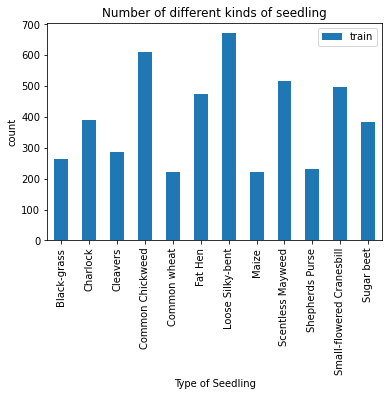

In [19]:
# Create a bar chart of train data using pandas bar function
df.set_index("name").plot.bar()
plt.xlabel("Type of Seedling")
plt.ylabel("count")
plt.title("Number of different kinds of seedling")

In [20]:
def show_final_history(history):
    fig, ax = plt.subplots(1,2,figsize=(15,5))
    ax[0].set_title("Loss")
    ax[1].set_title("Accuracy")
    ax[0].plot(history.history["loss"],label="Loss")
    ax[0].plot(history.history["val_loss"],label="Test Loss")
    ax[1].plot(history.history["accuracy"],label="Accuracy")
    ax[1].plot(history.history["val_accuracy"],label="Test Accuracy")
    
    ax[0].legend(loc="upper right")
    ax[1].legend(loc="lower right")
    

In [21]:
# Loading and Splitting data in to Train and Test datasets
from tensorflow.keras.utils import to_categorical
train_labels=to_categorical(train_labels,num_classes=nb_classes)

In [22]:
train_images1=np.array(train_images,dtype=np.float32)
train_labels1=np.array(train_labels,dtype=np.float32)

In [23]:
train_labels1.shape

(4767, 12)

In [24]:
X_train_P1,X_val_P1,y_train_P1,y_val_P1 = train_test_split(train_images1,train_labels1,test_size=0.3,random_state=23)

In [34]:
y_train_P1

array([[0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 1., 0., ..., 0., 0., 0.]], dtype=float32)

In [25]:
y_train_P1.shape

(3336, 12)

This part of the code is just to visualize the datasets as per their categories

In [26]:
from glob import glob
images_per_class = {}
for class_folder_name in os.listdir(project_path):
    class_folder_path = os.path.join(project_path, class_folder_name)
    class_label = class_folder_name
    images_per_class[class_label] = []
    for image_path in glob(os.path.join(class_folder_path, "*.png")):
        image_bgr = cv2.imread(image_path, cv2.IMREAD_COLOR)
        images_per_class[class_label].append(image_bgr)

In [27]:
def plot_for_class(label):
    nb_rows = 3
    nb_cols = 3
    fig, axs = plt.subplots(nb_rows, nb_cols, figsize=(6, 6))

    n = 0
    for i in range(0, nb_rows):
        for j in range(0, nb_cols):
            axs[i, j].xaxis.set_ticklabels([])
            axs[i, j].yaxis.set_ticklabels([])
            axs[i, j].imshow(images_per_class[label][n])
            n += 1 

In [28]:
for key,value in images_per_class.items():
    print("{0} -> {1}".format(key, len(value)))

Black-grass -> 263
Charlock -> 390
Cleavers -> 287
Common Chickweed -> 611
Common wheat -> 221
Fat Hen -> 475
Loose Silky-bent -> 671
Maize -> 221
Scentless Mayweed -> 516
Shepherds Purse -> 231
Small-flowered Cranesbill -> 496
Sugar beet -> 385


In [29]:
def plot_for_class(label):
    nb_rows = 3
    nb_cols = 3
    fig, axs = plt.subplots(nb_rows, nb_cols, figsize=(6, 6))

    n = 0
    for i in range(0, nb_rows):
        for j in range(0, nb_cols):
            axs[i, j].xaxis.set_ticklabels([])
            axs[i, j].yaxis.set_ticklabels([])
            axs[i, j].imshow(images_per_class[label][n])
            n += 1  

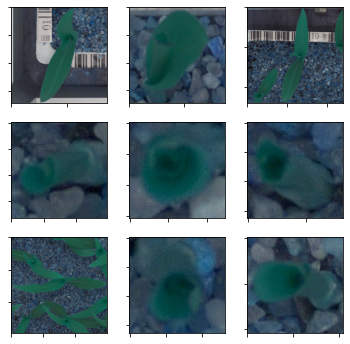

In [30]:
plot_for_class("Maize")

In [32]:
y_train_P1

array([[0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 1., 0., ..., 0., 0., 0.]], dtype=float32)

In [140]:
# Build a CNN model

from tensorflow.keras.models import Sequential, Model
from tensorflow.keras.layers import Conv2D, Dropout, MaxPooling2D, Flatten, Dense
from tensorflow.keras.regularizers import l2
# Initialize the model
model_P1_CNN = Sequential()

model_P1_CNN.add(tensorflow.keras.layers.BatchNormalization())
# Add a Convolutional Layer with 32 filters of size 3X3 and activation function as 'relu' 
model_P1_CNN.add(Conv2D(filters=64, kernel_size=5, activation="relu", input_shape=(150, 150, 3)))

# Add a Convolutional Layer with 64 filters of size 3X3 and activation function as 'relu' 
model_P1_CNN.add(Conv2D(filters=64, kernel_size=3, activation="relu"))

# Add a MaxPooling Layer of size 2X2 
model_P1_CNN.add(MaxPooling2D(pool_size=(2, 2)))

# Apply Dropout with 0.2 probability 
model_P1_CNN.add(Dropout(rate=0.2))

# Flatten the layer
model_P1_CNN.add(Flatten())

# Add Fully Connected Layer with 128 units and activation function as 'relu'
model_P1_CNN.add(Dense(128, activation="relu",kernel_regularizer=l2(0.01)))

#Add Fully Connected Layer with 10 units and activation function as 'softmax'
model_P1_CNN.add(Dense(12, activation="softmax"))

In [141]:
# Compile the model
model_P1_CNN.compile(loss="categorical_crossentropy", metrics=["accuracy"], optimizer="sgd")

In [158]:
model_P1_CNN.summary()

Model: "sequential_10"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
batch_normalization_9 (Batch (None, 150, 150, 3)       12        
_________________________________________________________________
conv2d_14 (Conv2D)           (None, 146, 146, 64)      4864      
_________________________________________________________________
conv2d_15 (Conv2D)           (None, 144, 144, 64)      36928     
_________________________________________________________________
max_pooling2d_7 (MaxPooling2 (None, 72, 72, 64)        0         
_________________________________________________________________
dropout_7 (Dropout)          (None, 72, 72, 64)        0         
_________________________________________________________________
flatten_9 (Flatten)          (None, 331776)            0         
_________________________________________________________________
dense_26 (Dense)             (None, 128)             

In [143]:
# Let us first fit the model without Data Augmentation
# Fit the model
history_P1_CNN=model_P1_CNN.fit(x=X_train_P1, y=y_train_P1, batch_size=32, epochs=10, validation_data=(X_val_P1, y_val_P1))

Epoch 1/10
105/105 [==============================] - 238s 2s/step - loss: 4.7982 - accuracy: 0.2317 - val_loss: 4.8193 - val_accuracy: 0.3326
Epoch 2/10
105/105 [==============================] - 230s 2s/step - loss: 3.9572 - accuracy: 0.5109 - val_loss: 3.8876 - val_accuracy: 0.4570
Epoch 3/10
105/105 [==============================] - 230s 2s/step - loss: 3.2535 - accuracy: 0.6873 - val_loss: 4.3431 - val_accuracy: 0.4284
Epoch 4/10
105/105 [==============================] - 230s 2s/step - loss: 2.9843 - accuracy: 0.7653 - val_loss: 3.6792 - val_accuracy: 0.4962
Epoch 5/10
105/105 [==============================] - 230s 2s/step - loss: 2.6746 - accuracy: 0.8440 - val_loss: 2.9712 - val_accuracy: 0.7324
Epoch 6/10
105/105 [==============================] - 230s 2s/step - loss: 2.3747 - accuracy: 0.9171 - val_loss: 3.2499 - val_accuracy: 0.6695
Epoch 7/10
105/105 [==============================] - 230s 2s/step - loss: 2.1992 - accuracy: 0.9529 - val_loss: 3.0248 - val_accuracy: 0.7352

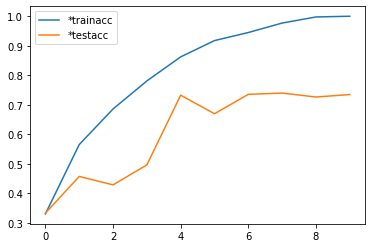

In [144]:
from matplotlib import pyplot
pyplot.plot(history_P1_CNN.history['accuracy'], label='*trainacc')
pyplot.plot(history_P1_CNN.history['val_accuracy'], label='*testacc')
#pyplot.plot(history.history['loss'], label='trainloss')
#pyplot.plot(history.history['val_loss'], label='testloss')
pyplot.legend()
pyplot.show()

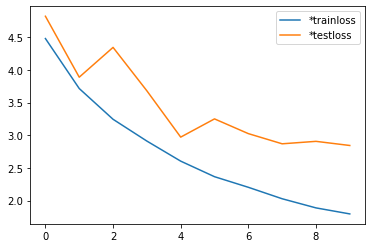

In [147]:
from matplotlib import pyplot
pyplot.plot(history_P1_CNN.history['loss'], label='*trainloss')
pyplot.plot(history_P1_CNN.history['val_loss'], label='*testloss')
#pyplot.plot(history.history['loss'], label='trainloss')
#pyplot.plot(history.history['val_loss'], label='testloss')
pyplot.legend()
pyplot.show()

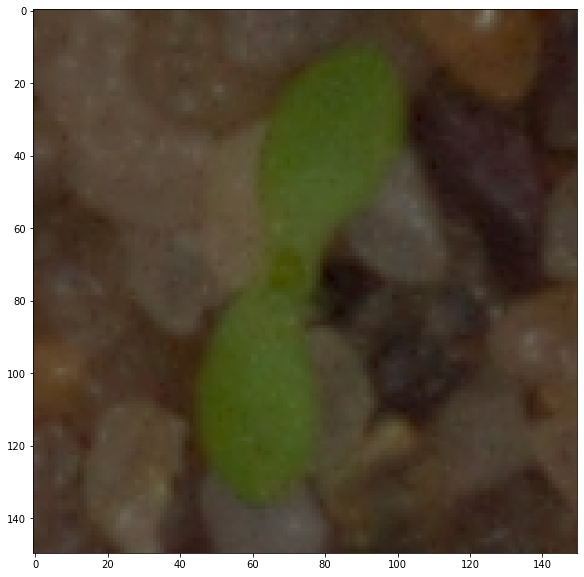

Prediction for above image:  8


In [148]:
plt.figure(figsize=(10,10))
plt.imshow(train_images[3545],cmap="gray")
plt.show()
print("Prediction for above image: ", np.argmax(model_P1_CNN.predict(train_images[3545].reshape(1,150,150,3))))

In [149]:
img_path = 'C:/Users\VISNN\Downloads\Computer_Vision\Part-1-PlantSeedling\Seedling_Prediction'
import os
import cv2
file = 'Predict.png'
#img_path=(os.path.join(img_path),file)
img_path=os.path.join(img_path,file)
img = cv2.imread(img_path)
img = cv2.cvtColor(img,cv2.COLOR_BGR2RGB)
img = cv2.resize(img,(150,150))


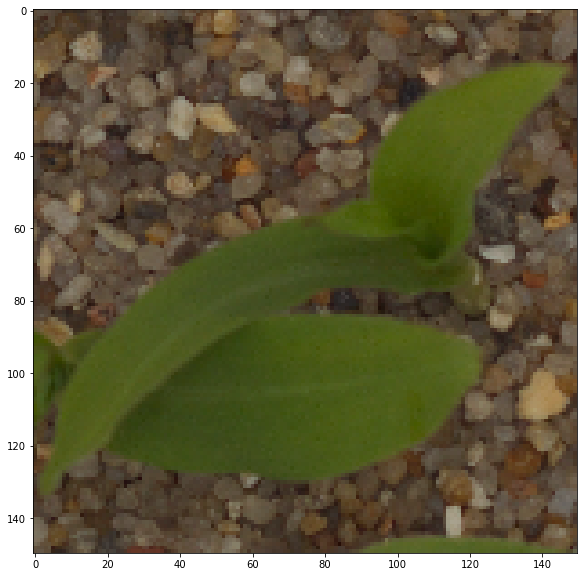

In [150]:
plt.figure(figsize=(10,10))
plt.imshow(img,cmap="gray")
plt.show()

In [151]:
print("Prediction for above image: ", np.argmax(model_P1_CNN.predict(img.reshape(1,150,150,3))))

Prediction for above image:  7


In [152]:
# Now let us predict a neural network to train the images

In [161]:
X_train_P1_NN,X_val_P1_NN,y_train_P1_NN,y_val_P1_NN = train_test_split(train_images1,train_labels1,test_size=0.3,random_state=16)

In [165]:
y_train_P1_NN.shape

(3336, 12)

In [162]:

batch_size = 16

IGD = ImageDataGenerator(
                        horizontal_flip=True,
                        vertical_flip=True,
                        rotation_range=20,width_shift_range=0.2,height_shift_range=0.2)
#                         validation_split=0.3)

train_generator = IGD.flow(x=X_train_P1_NN,
                          y=y_train_NN,
                          batch_size=batch_size,
                          shuffle=True,
                          seed=42)
#                           subset="training")

validation_generator = IGD.flow(x=X_val_P1_NN,
                               y=y_val_NN,
                               batch_size=batch_size,
                               shuffle=True,
                               seed=42)
#                                subset="validation")

In [166]:
from tensorflow.keras.models import Sequential 
from tensorflow.keras.layers import Flatten, Dense
from tensorflow.keras.regularizers import l2
from tensorflow.keras.layers import Dropout
model_NN = Sequential()
model_NN.add(Flatten())
model_NN.add(tensorflow.keras.layers.BatchNormalization())
model_NN.add(Dense(200,activation="relu"))
model_NN.add(Dense(250,activation="relu",kernel_regularizer=l2(0.01)))
model_NN.add(Dense(150,activation="relu",kernel_regularizer=l2(0.01)))
model_NN.add(Dense(150,activation="relu",kernel_regularizer=l2(0.01)))
model_NN.add(Dense(150,activation="relu",kernel_regularizer=l2(0.01)))
model_NN.add(Dense(12,activation="softmax"))

In [169]:
# Compile the model
#opt=sgd(lr=0.001,momentum=0.9)
from tensorflow.keras.optimizers import Adam,SGD

sgd=SGD(lr=0.001,momentum=0.9)
model_NN.compile(loss="categorical_crossentropy", metrics=["accuracy"], optimizer=sgd)

# Fit the model
history_P1_NN=model_NN.fit(X_train_P1_NN, y_train_P1_NN, batch_size=16, epochs=10, validation_data=(X_val_P1_NN, y_val_P1_NN))

Epoch 1/10
209/209 [==============================] - 14s 63ms/step - loss: 9.2721 - accuracy: 0.2115 - val_loss: 8.6076 - val_accuracy: 0.3187
Epoch 2/10
209/209 [==============================] - 13s 61ms/step - loss: 7.9013 - accuracy: 0.4965 - val_loss: 7.7579 - val_accuracy: 0.4277
Epoch 3/10
209/209 [==============================] - 13s 61ms/step - loss: 7.0536 - accuracy: 0.6232 - val_loss: 7.2075 - val_accuracy: 0.4675
Epoch 4/10
209/209 [==============================] - 13s 62ms/step - loss: 6.2757 - accuracy: 0.7388 - val_loss: 6.7863 - val_accuracy: 0.5094
Epoch 5/10
209/209 [==============================] - 13s 62ms/step - loss: 5.6598 - accuracy: 0.8100 - val_loss: 6.3973 - val_accuracy: 0.5087
Epoch 6/10
209/209 [==============================] - 13s 61ms/step - loss: 5.1199 - accuracy: 0.8743 - val_loss: 6.0563 - val_accuracy: 0.5038
Epoch 7/10
209/209 [==============================] - 13s 62ms/step - loss: 4.6660 - accuracy: 0.9089 - val_loss: 6.0307 - val_accuracy:

In [170]:
model_NN.summary()

Model: "sequential_13"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten_12 (Flatten)         (None, 67500)             0         
_________________________________________________________________
batch_normalization_12 (Batc (None, 67500)             270000    
_________________________________________________________________
dense_40 (Dense)             (None, 200)               13500200  
_________________________________________________________________
dense_41 (Dense)             (None, 250)               50250     
_________________________________________________________________
dense_42 (Dense)             (None, 150)               37650     
_________________________________________________________________
dense_43 (Dense)             (None, 150)               22650     
_________________________________________________________________
dense_44 (Dense)             (None, 150)             

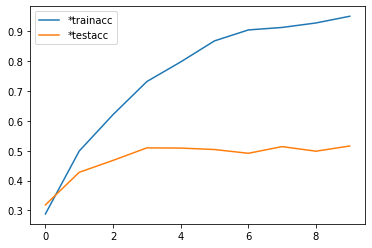

In [171]:
from matplotlib import pyplot
pyplot.plot(history_P1_NN.history['accuracy'], label='*trainacc')
pyplot.plot(history_P1_NN.history['val_accuracy'], label='*testacc')
#pyplot.plot(history.history['loss'], label='trainloss')
#pyplot.plot(history.history['val_loss'], label='testloss')
pyplot.legend()
pyplot.show()

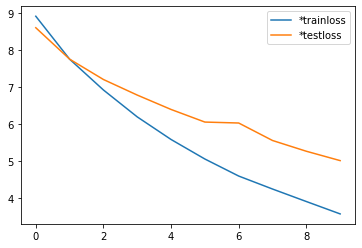

In [172]:
from matplotlib import pyplot
pyplot.plot(history_P1_NN.history['loss'], label='*trainloss')
pyplot.plot(history_P1_NN.history['val_loss'], label='*testloss')
#pyplot.plot(history.history['loss'], label='trainloss')
#pyplot.plot(history.history['val_loss'], label='testloss')
pyplot.legend()
pyplot.show()

In [173]:
img_path = 'C:/Users\VISNN\Downloads\Computer_Vision\Part-1-PlantSeedling\Seedling_Prediction'
import os
import cv2
file = 'Predict.png'
#img_path=(os.path.join(img_path),file)
img_path=os.path.join(img_path,file)
img = cv2.imread(img_path)
img = cv2.cvtColor(img,cv2.COLOR_BGR2RGB)
img = cv2.resize(img,(150,150))

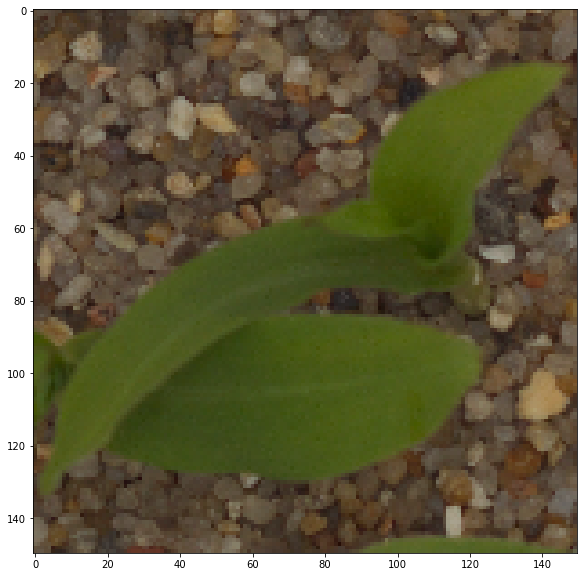

In [174]:
plt.figure(figsize=(10,10))
plt.imshow(img,cmap="gray")
plt.show()

In [175]:
print("Prediction for above image: ", np.argmax(model_NN.predict(img.reshape(1,150,150,3))))

Prediction for above image:  7


In [176]:
# Let us fit an SVM algorithm

In [177]:
from sklearn import svm
from sklearn.model_selection import GridSearchCV
#param_grid={'C':[0.1,1,10,100],'gamma':[0.0001,0.001,0.1,1],'kernel':['rbf','poly']}
svc=svm.SVC(probability=True)
#model=GridSearchCV(svc,param_grid)

In [178]:
from skimage import color
from skimage import io

#img = color.rgb2gray(io.imread('image.png'))

In [179]:
import pandas as pd
import os
from skimage.transform import resize
from skimage.io import imread
import numpy as np
import matplotlib.pyplot as plt
Categories=['Black-grass', 'Charlock', 'Cleavers', 'Common Chickweed', 'Common wheat', 'Fat Hen',
              'Loose Silky-bent', 'Maize', 'Scentless Mayweed', 'Shepherds Purse',
              'Small-flowered Cranesbill', 'Sugar beet']
flat_data_arr=[] #input array
target_arr=[] #output array
datadir= 'C:/Users/VISNN/Downloads/Computer_Vision/Part-1-PlantSeedling/train/'
#path which contains all the categories of images
for i in Categories:
    
    print(f'loading... category : {i}')
    path=os.path.join(datadir,i)
    for img in os.listdir(path):
        
        img_array=imread(os.path.join(path,img))
        #img_array = color.rgb2gray(io.imread(img_array))
        img_array = cv2.cvtColor(img_array,cv2.COLOR_BGR2RGB)

        img_resized=resize(img_array,(100,100,3))
        flat_data_arr.append(img_resized.flatten())
        target_arr.append(Categories.index(i))
    print(f'loaded category:{i} successfully')
flat_data=np.array(flat_data_arr)
target=np.array(target_arr)
df=pd.DataFrame(flat_data) #dataframe
df['Target']=target
x=df.iloc[:,:-1] #input data 
y=df.iloc[:,-1] #output data

loading... category : Black-grass
loaded category:Black-grass successfully
loading... category : Charlock
loaded category:Charlock successfully
loading... category : Cleavers
loaded category:Cleavers successfully
loading... category : Common Chickweed
loaded category:Common Chickweed successfully
loading... category : Common wheat
loaded category:Common wheat successfully
loading... category : Fat Hen
loaded category:Fat Hen successfully
loading... category : Loose Silky-bent
loaded category:Loose Silky-bent successfully
loading... category : Maize
loaded category:Maize successfully
loading... category : Scentless Mayweed
loaded category:Scentless Mayweed successfully
loading... category : Shepherds Purse
loaded category:Shepherds Purse successfully
loading... category : Small-flowered Cranesbill
loaded category:Small-flowered Cranesbill successfully
loading... category : Sugar beet
loaded category:Sugar beet successfully


In [181]:
from PIL import Image
import numpy as np

img = Image.fromarray(flat_data[275], 'RGB')
img.show()

In [182]:
from sklearn.model_selection import train_test_split
X_train_svm,X_val_svm,y_train_svm,y_val_svm = train_test_split(x,y,test_size=0.3)

In [183]:
svc.fit(X_train_svm,y_train_svm)

SVC(probability=True)

In [184]:
# generate predictions
from sklearn.metrics import accuracy_score
y_pred = svc.predict(X_val_svm)

# calculate accuracy
accuracy = accuracy_score(y_val_svm, y_pred)
print('Model accuracy is: ', accuracy)

Model accuracy is:  0.4863731656184486


In [185]:
img_path = 'C:/Users\VISNN\Downloads\Computer_Vision\Part-1-PlantSeedling\Seedling_Prediction'
import os
import cv2
file = 'Predict.png'
#img_path=(os.path.join(img_path),file)
img_path=os.path.join(img_path,file)
img = cv2.imread(img_path)
img = cv2.cvtColor(img,cv2.COLOR_BGR2RGB)
img = cv2.resize(img,(150,150))
img_resized=resize(img,(100,100,3))

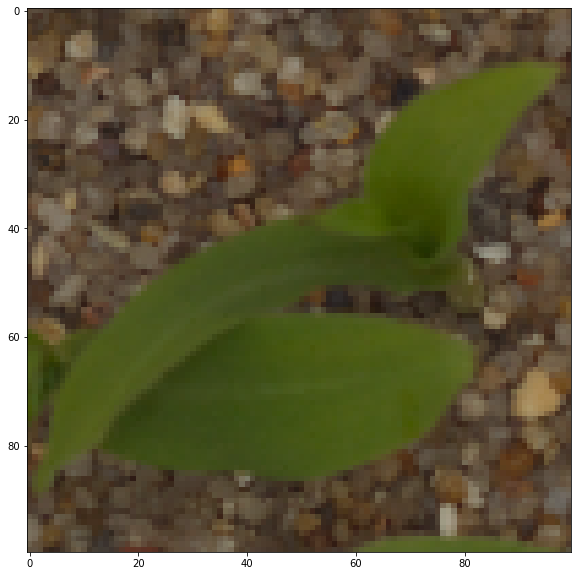

In [186]:
plt.figure(figsize=(10,10))
plt.imshow(img_resized,cmap="gray")
plt.show()

In [187]:
img_resized.shape

(100, 100, 3)

In [188]:
print("Prediction for above image: ", np.argmax(svc.predict(img_resized.reshape(1,-1))))
img_resized.shape

Prediction for above image:  0


(100, 100, 3)

As we can see prediction with SVM is wrong.

# Part -2 

CNN works on a diffferent methodology wherein Feature Extraction process is also automated which is not the case in Nueral network and this is one of the main reasons why CNN is far more robust and stronger than NN
COnventional Supervised learning does not use nueral network is not a preffered technique for image processing and hence the accuracy obtained is pretty low as we can see.
convolutional neural networks can extract informative features from images, eliminating the need of traditional manual image processing methods

# PART -4 - PLANT SPECIES BOTANICAL RESEARCH

In [13]:
import tflearn
from tflearn.layers.core import input_data, dropout, fully_connected
from tflearn.layers.conv import conv_2d, max_pool_2d
from tflearn.layers.normalization import local_response_normalization
from tflearn.layers.estimator import regression

Instructions for updating:
non-resource variables are not supported in the long term
curses is not supported on this machine (please install/reinstall curses for an optimal experience)


In [14]:
import tflearn.datasets.oxflower17 as oxflower17

In [15]:
X2, Y2 = oxflower17.load_data(one_hot=False)

In [16]:
X2.shape

(1360, 227, 227, 3)

In [17]:
Y2[2]

array([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1.])

In [18]:
c=np.where(Y2)[1]

In [19]:
c.shape

(1360,)

label in one hot encode= [0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
label in label encode= 8


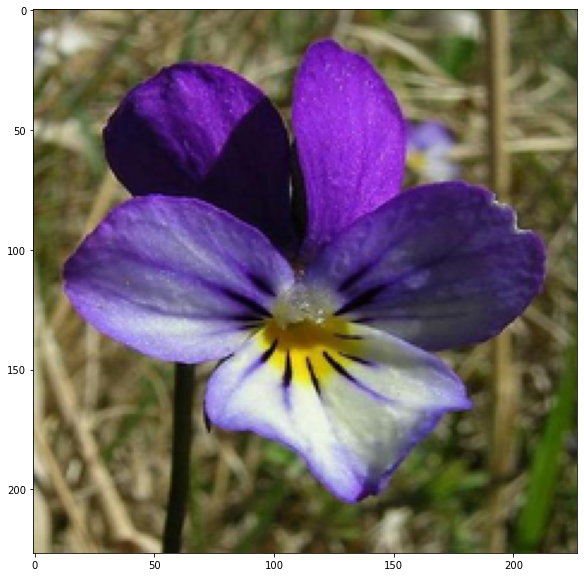

In [20]:
plt.figure(figsize=(10,10))
plt.imshow(X2[1],cmap="gray")
print("label in one hot encode=",Y2[1])
print("label in label encode=",c[1])
plt.show()

In [21]:
X2[1].shape

(227, 227, 3)

Displaying the first 10 images and label encodes for the dataset...

label in one hot encode= [0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
label in label encode= 4


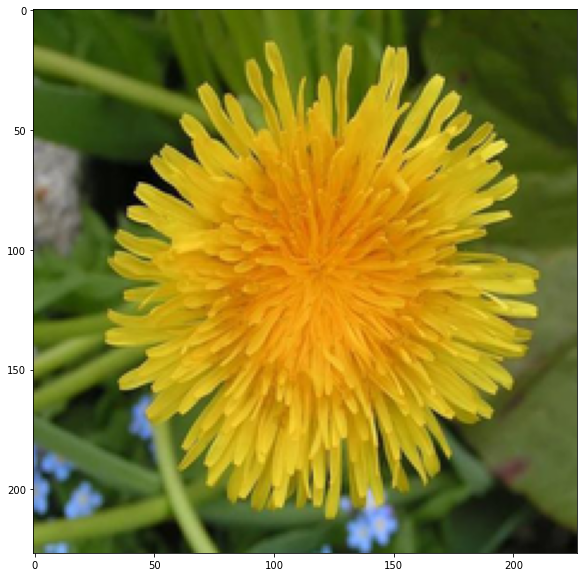

label in one hot encode= [0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
label in label encode= 8


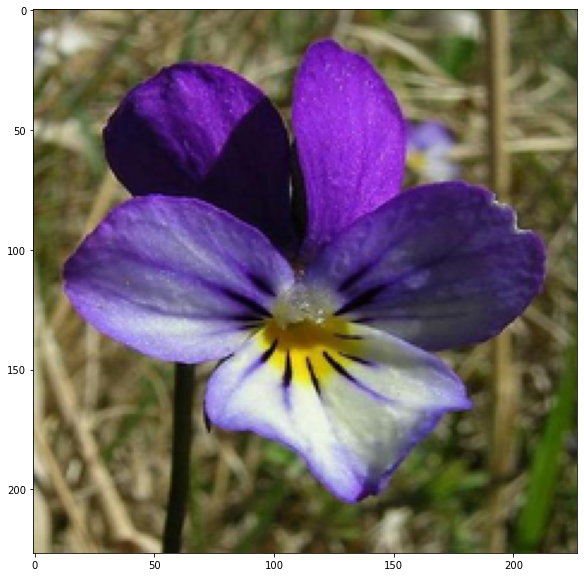

label in one hot encode= [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
label in label encode= 16


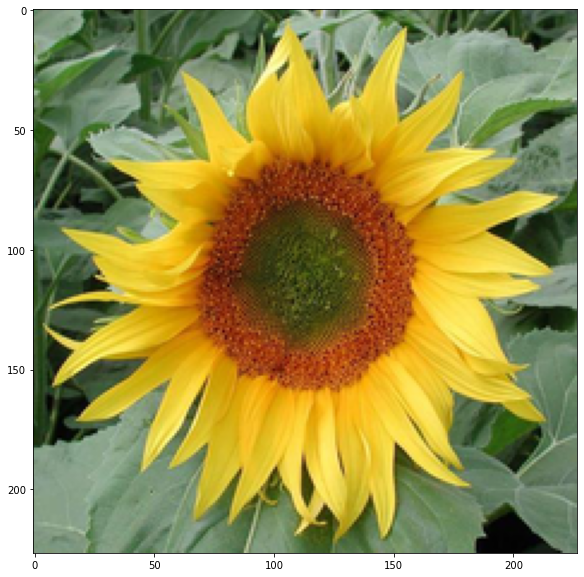

label in one hot encode= [0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
label in label encode= 5


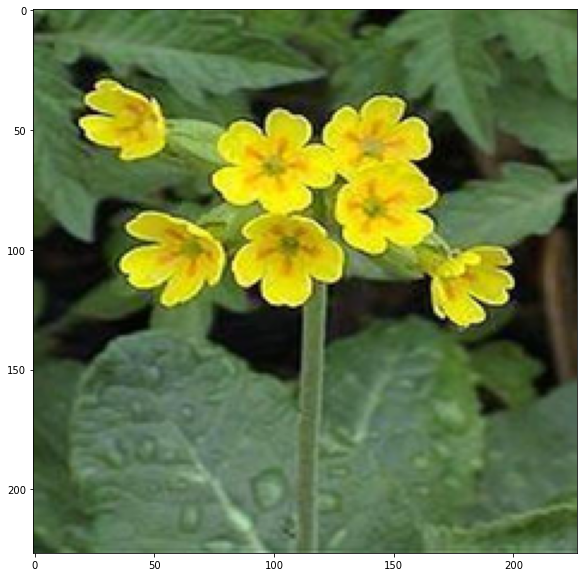

label in one hot encode= [0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
label in label encode= 2


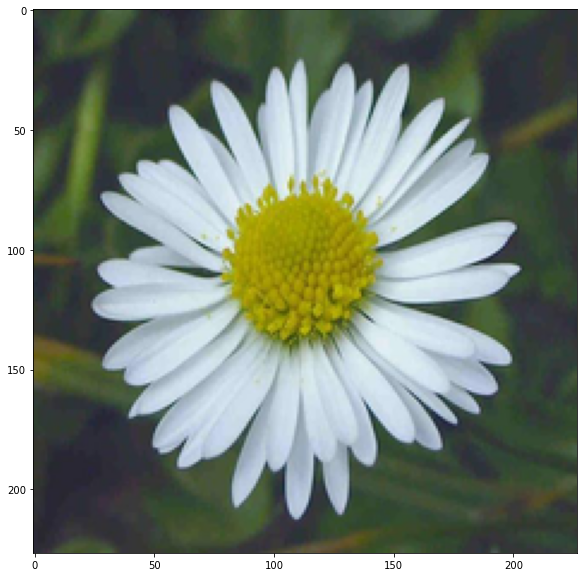

label in one hot encode= [0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
label in label encode= 6


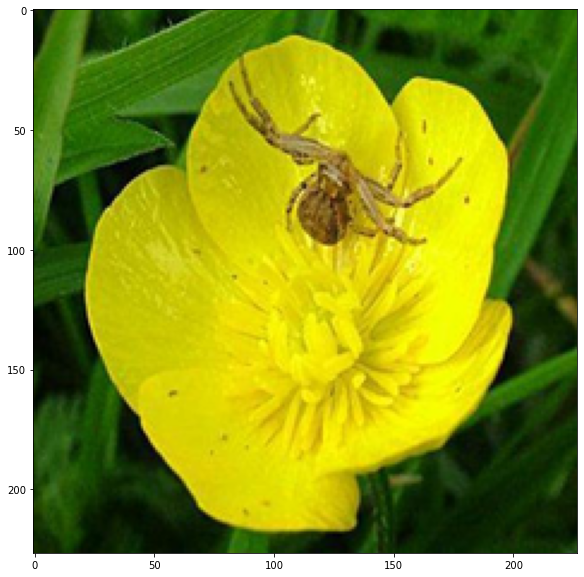

label in one hot encode= [0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
label in label encode= 7


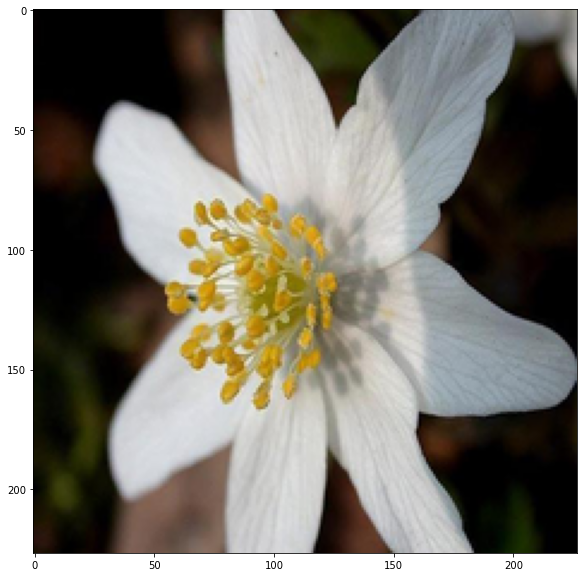

label in one hot encode= [0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
label in label encode= 7


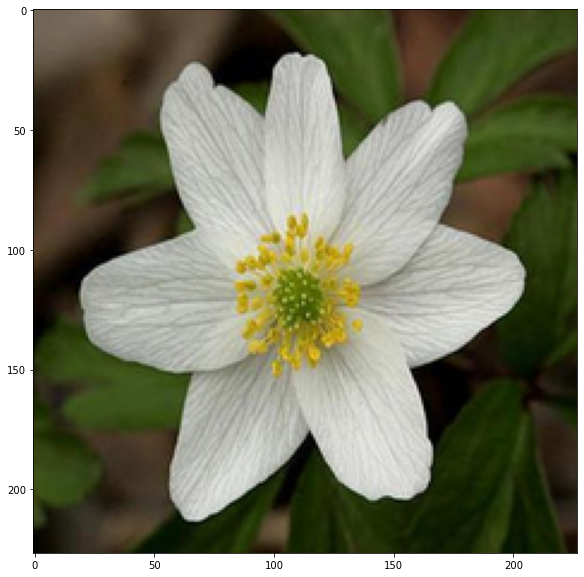

label in one hot encode= [0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
label in label encode= 2


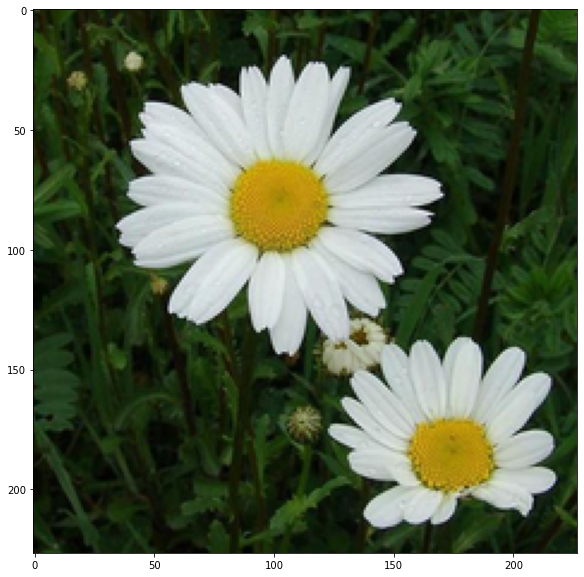

label in one hot encode= [0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
label in label encode= 7


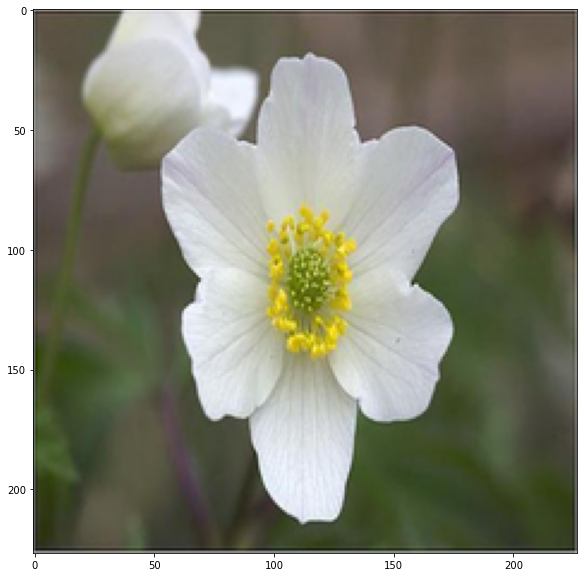

In [22]:
for idx in range(10):
    plt.figure(figsize=(10,10))
    plt.imshow(X2[idx],cmap="gray")
    print("label in one hot encode=",Y2[idx])
    print("label in label encode=",c[idx])
    plt.show()
    

As we can see the flower categories are already encoded here and there are roughly 80 images in each category which amount to about 17 in number so the total number of images is around (80*17) = 1360 in  number.
The labels are in the one hot encoded form and are in the shape of 1360X17 size..

Application of different filters to the images

In [23]:
# First filter is the average filter where the average value of the pixels is used
# and the central element is replaced with this average..

img=X2[1]
img= cv2.convertScaleAbs(img,alpha=(255.0))
cv2.imwrite('Sample_Flower.png', cv2.cvtColor(img, cv2.COLOR_RGB2BGR),[cv2.IMWRITE_JPEG_QUALITY, 100]) 




True

This is the blurred image


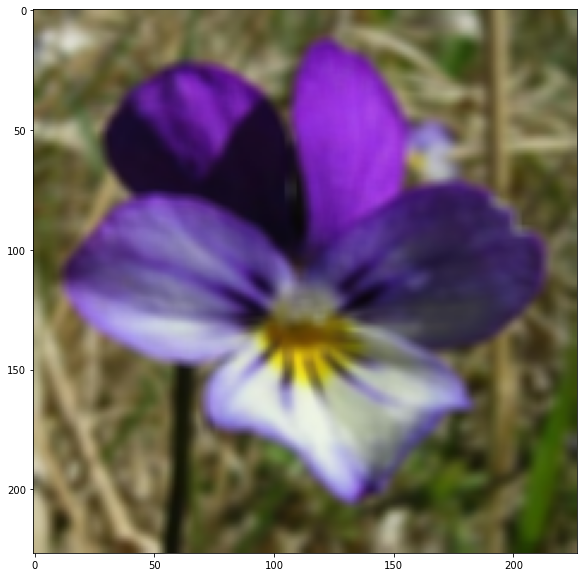

In [24]:
img_tbf= cv2.imread('Sample_Flower.png')
def box_kernel(size):
    k = np.ones((size,size),np.float32)/(size**2)
    return k
# let us use a 5 by 5 kernel
size =5
box_filter_img = cv2.filter2D(img,-1,box_kernel(size))
# Display the blurred image
plt.figure(figsize=(10,10))
plt.imshow(box_filter_img,cmap="gray")
print("This is the blurred image")
plt.show()
cv2.imwrite('Sample_Flower_blurred.png', cv2.cvtColor(box_filter_img, cv2.COLOR_RGB2BGR),[cv2.IMWRITE_JPEG_QUALITY, 100]) 
img_blurred= cv2.imread('Sample_Flower_blurred.png')


In [25]:
# Function to plot the images Side by Side :
def plot_img(images, titles):
    fig, axs = plt.subplots(nrows=1,ncols=len(images),figsize=(15,15))
    for i, p in enumerate(images):
        axs[i].imshow(cv2.cvtColor(p, cv2.COLOR_BGR2RGB))
        axs[i].set_title(titles[i])
        #axs[i].axis('off')
    plt.show()

In [26]:
img_blurred= cv2.imread('Sample_Flower_blurred.png')

with kernel size =5


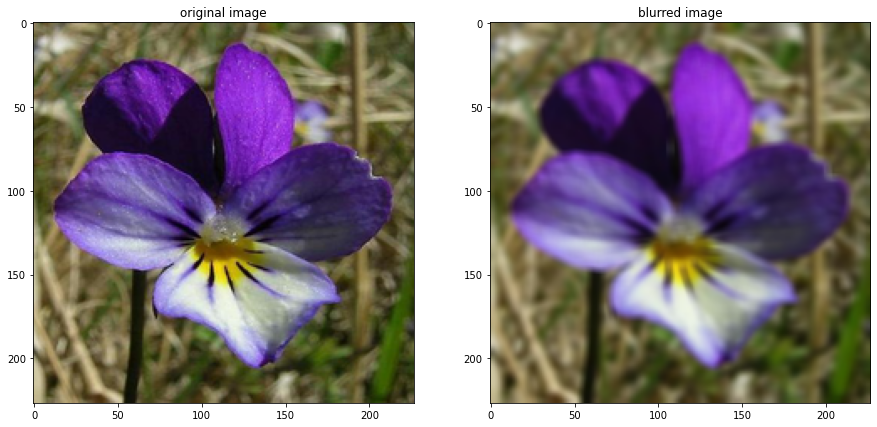

In [27]:
print("with kernel size =5")
a_img = img_tbf
b_img = img_blurred
images=[a_img,b_img]
titles=['original image','blurred image']
plot_img(images,titles)

In [28]:
# CONTOUR FILTER

In [29]:
from PIL import Image, ImageFilter
from PIL.ImageFilter import (BLUR, CONTOUR, DETAIL, EDGE_ENHANCE, EDGE_ENHANCE_MORE,EMBOSS,FIND_EDGES,SMOOTH, SMOOTH_MORE, SHARPEN)

In [30]:
img_tbcontour = Image.open('Sample_Flower.png')
img_contour=img_tbcontour.filter(CONTOUR)
img_contour.save('contour.png')
img_contour.show()

In [31]:
img_contour = cv2.imread('contour.png')

Application of the contour filter


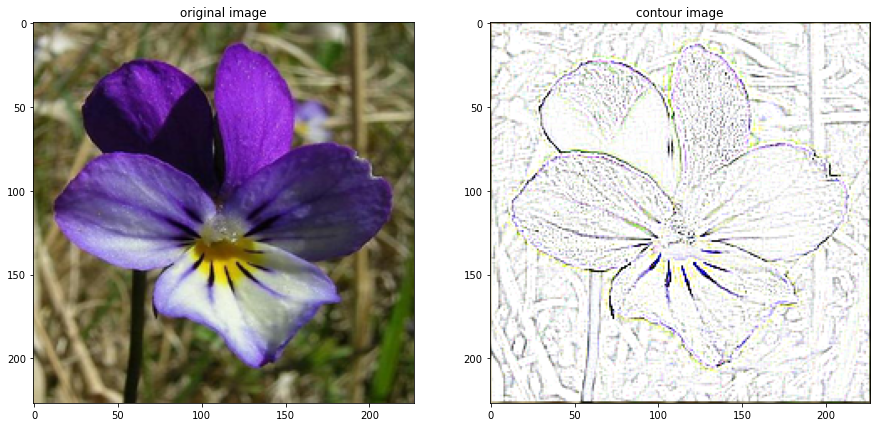

In [32]:
print("Application of the contour filter")
a_img = img_tbf
b_img = img_contour
images=[a_img,b_img]
titles=['original image','contour image']
plot_img(images,titles)

In [33]:
# EDGE DETECTION FILTER

In [34]:
img_tbedge = Image.open('Sample_Flower.png')
img_tbedge=img_tbedge.filter(FIND_EDGES)
img_tbedge.save('EDGE.png')
img_tbedge.show()

In [35]:
img_EDGE = cv2.imread('EDGE.png')

Application of the EDGE filter


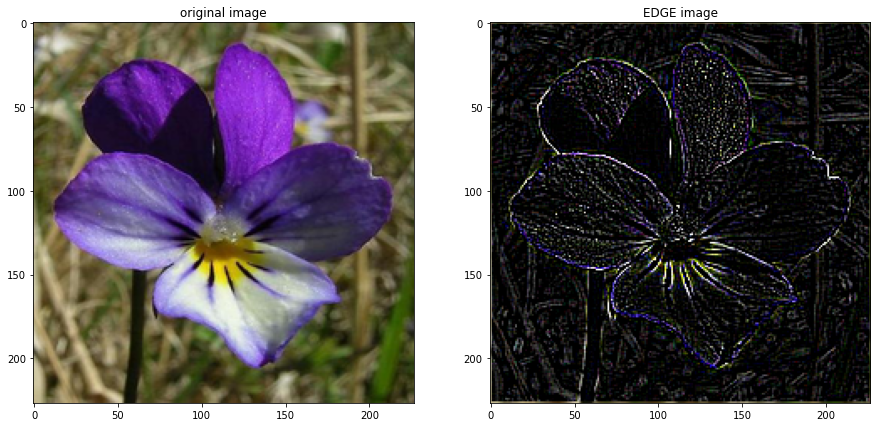

In [36]:
print("Application of the EDGE filter")
a_img = img_tbf
b_img = img_EDGE
images=[a_img,b_img]
titles=['original image','EDGE image']
plot_img(images,titles)

In [37]:
# EMBOSS FIlter

In [38]:
img_temboss = Image.open('Sample_Flower.png')
img_temboss=img_temboss.filter(EMBOSS)
img_temboss.save('EMBOSS.png')
img_temboss.show()

In [39]:
img_emboss = cv2.imread('EMBOSS.png')

Application of the EDGE filter


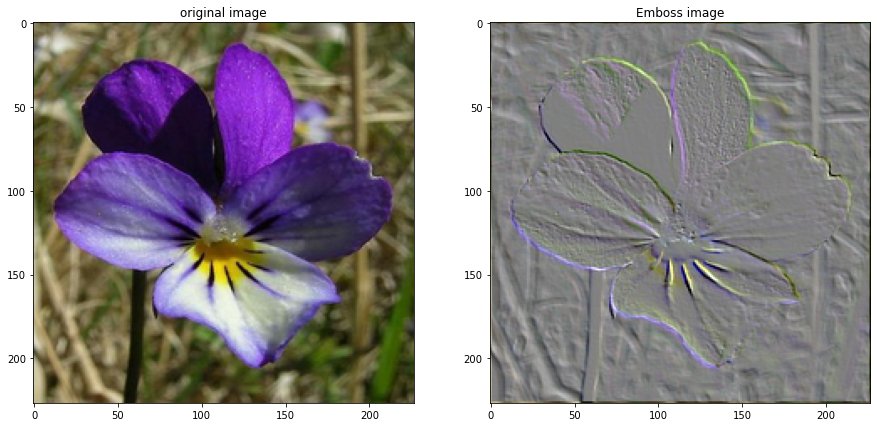

In [40]:
print("Application of the EDGE filter")
a_img = img_tbf
b_img = img_emboss
images=[a_img,b_img]
titles=['original image','Emboss image']
plot_img(images,titles)

In [41]:
# Let us start fitting CNN models on this data-set 

In [42]:
X_train_P4,X_val_P4,y_train_P4,y_val_P4 = train_test_split(X2,Y2,test_size=0.3, random_state=42)

In [43]:
X_train_P4.shape

(952, 227, 227, 3)

In [44]:
X_val_P4.shape

(408, 227, 227, 3)

In [45]:
# Build a CNN model

from tensorflow.keras.models import Sequential, Model
from tensorflow.keras.layers import Conv2D, Dropout, MaxPooling2D, Flatten, Dense
from tensorflow.keras.regularizers import l2
# Initialize the model
model_P4 = Sequential()

model_P4.add(tensorflow.keras.layers.BatchNormalization())
# Add a Convolutional Layer with 32 filters of size 3X3 and activation function as 'relu' 
model_P4.add(Conv2D(filters=64, kernel_size=5, activation="relu", input_shape=(227, 227, 3)))

# Add a Convolutional Layer with 64 filters of size 3X3 and activation function as 'relu' 
model_P4.add(Conv2D(filters=64, kernel_size=3, activation="relu"))

# Add a Convolutional Layer with 64 filters of size 3X3 and activation function as 'relu' 
model_P4.add(Conv2D(filters=64, kernel_size=3, activation="relu"))

# Add a MaxPooling Layer of size 2X2 
model_P4.add(MaxPooling2D(pool_size=(2, 2)))

# Apply Dropout with 0.2 probability 
model_P4.add(Dropout(rate=0.2))

# Flatten the layer
model_P4.add(Flatten())

# Add Fully Connected Layer with 128 units and activation function as 'relu'
model_P4.add(Dense(128, activation="relu",kernel_regularizer=l2(0.05)))

#Add Fully Connected Layer with 10 units and activation function as 'softmax'
model_P4.add(Dense(17, activation="softmax"))

In [46]:
# Compile the model
from tensorflow.keras.optimizers import Adam,SGD
sgd=SGD(lr=0.001,momentum=0.9)
model_P4.compile(loss="categorical_crossentropy", metrics=["accuracy"], optimizer=sgd)

In [47]:
# Use earlystopping
callback = tensorflow.keras.callbacks.EarlyStopping(monitor='val_accuracy', min_delta=0.01)

# Fit the model
history_P4_NA=model_P4.fit(x=X_train_P4, y=y_train_P4, batch_size=32, epochs=5, validation_data=(X_val_P4, y_val_P4))

Train on 952 samples, validate on 408 samples
Epoch 1/5
952/952 [==============================] - ETA: 0s - loss: 15.1329 - acc: 0.1618

C:\Users\VISNN\Anaconda3\lib\site-packages\tensorflow\python\keras\engine\training.py:2325: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  warnings.warn('`Model.state_updates` will be removed in a future version. '


952/952 [==============================] - 133s 140ms/sample - loss: 15.1329 - acc: 0.1618 - val_loss: 14.6332 - val_acc: 0.2230
Epoch 2/5
952/952 [==============================] - 134s 141ms/sample - loss: 13.6658 - acc: 0.4317 - val_loss: 13.6673 - val_acc: 0.3799
Epoch 3/5
952/952 [==============================] - 137s 144ms/sample - loss: 12.4233 - acc: 0.6471 - val_loss: 12.7097 - val_acc: 0.4632
Epoch 4/5
952/952 [==============================] - 137s 144ms/sample - loss: 11.4243 - acc: 0.7763 - val_loss: 11.9326 - val_acc: 0.4902
Epoch 5/5
952/952 [==============================] - 138s 145ms/sample - loss: 10.5505 - acc: 0.8508 - val_loss: 11.3779 - val_acc: 0.5319


In [48]:
model_P4.evaluate(X_train_P4, y_train_P4)
model_P4.evaluate(X_val_P4, y_val_P4)

[11.377902255338782, 0.53186274]

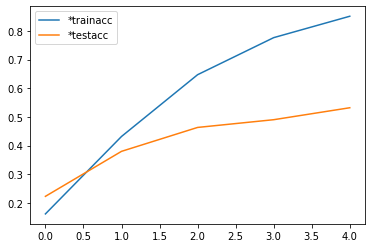

In [51]:
from matplotlib import pyplot
from sklearn.metrics import accuracy_score
pyplot.plot(history_P4_NA.history['acc'], label='*trainacc')
pyplot.plot(history_P4_NA.history['val_acc'], label='*testacc')
pyplot.legend()
pyplot.show()

Classic case of overfitting seen, this is because the data is not augmented.. Let us try augmenting and see what happens to the accuracy

In [52]:
batch_size = 16

IGD = ImageDataGenerator(
                        horizontal_flip=True,
                        vertical_flip=True,
                        rotation_range=20,width_shift_range=0.2,height_shift_range=0.2,shear_range=0.3,zoom_range=0.3)
#                         validation_split=0.3)

train_generator = IGD.flow(x=X_train_P4,
                          y=y_train_P4,
                          batch_size=batch_size,
                          shuffle=True,
                          seed=42)
#                           subset="training")

validation_generator = IGD.flow(x=X_val_P4,
                               y=y_val_P4,
                               batch_size=batch_size,
                               shuffle=True,
                               seed=42)
#                                subset="validation")

In [53]:
callback = tensorflow.keras.callbacks.EarlyStopping(monitor='val_acc', mode='max', min_delta=0.01,patience = 2)

history_aug=model_P4.fit(train_generator, epochs=5, steps_per_epoch=952//batch_size, validation_data=(validation_generator),validation_steps=408//batch_size)

Epoch 1/5
59/59 [==============================] - 143s 2s/step - batch: 29.0000 - size: 15.8644 - loss: 11.4300 - acc: 0.3066 - val_loss: 10.8307 - val_acc: 0.3150
Epoch 2/5
59/59 [==============================] - 153s 3s/step - batch: 29.0000 - size: 15.8644 - loss: 10.0923 - acc: 0.3697 - val_loss: 9.5361 - val_acc: 0.3850
Epoch 3/5
59/59 [==============================] - 153s 3s/step - batch: 29.0000 - size: 15.8644 - loss: 9.1311 - acc: 0.4327 - val_loss: 8.7223 - val_acc: 0.4300
Epoch 4/5
59/59 [==============================] - 152s 3s/step - batch: 29.0000 - size: 15.8644 - loss: 8.3556 - acc: 0.3953 - val_loss: 7.8729 - val_acc: 0.4700
Epoch 5/5
59/59 [==============================] - 149s 3s/step - batch: 29.0000 - size: 15.8644 - loss: 7.5368 - acc: 0.4316 - val_loss: 7.1374 - val_acc: 0.4400


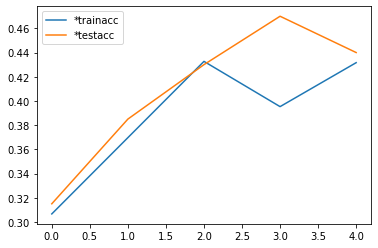

In [54]:
from matplotlib import pyplot
from sklearn.metrics import accuracy_score
pyplot.plot(history_aug.history['acc'], label='*trainacc')
pyplot.plot(history_aug.history['val_acc'], label='*testacc')
pyplot.legend()
pyplot.show()

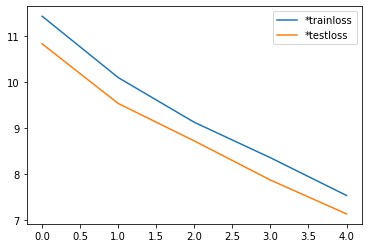

In [56]:
from matplotlib import pyplot
pyplot.plot(history_aug.history['loss'], label='*trainloss')
pyplot.plot(history_aug.history['val_loss'], label='*testloss')
#pyplot.plot(history.history['loss'], label='trainloss')
#pyplot.plot(history.history['val_loss'], label='testloss')
pyplot.legend()
pyplot.show()

In [57]:
# Build ALEXNET CNN model

from tensorflow.keras.models import Sequential, Model
from tensorflow.keras.layers import Conv2D, Dropout, MaxPooling2D, Flatten, Dense
from tensorflow.keras.regularizers import l2
# Initialize the model
model_P4_Alexnet = Sequential()

#1st convolutional layer

# Add a Convolutional Layer with 32 filters of size 3X3 and activation function as 'relu' 
model_P4_Alexnet.add(Conv2D(filters=96, kernel_size=11, activation="relu",strides=(4,4), input_shape=(227, 227, 3)))

# Add a MaxPooling Layer of size 2X2 
model_P4_Alexnet.add(MaxPooling2D(pool_size=(2, 2),strides=(2,2),padding='valid'))

# Batch Normalization 
model_P4_Alexnet.add(tensorflow.keras.layers.BatchNormalization())


# 2nd convolutional layer
# Add a Convolutional Layer with 64 filters of size 3X3 and activation function as 'relu' 
model_P4_Alexnet.add(Conv2D(filters=256, kernel_size=11,strides=(1,1),padding='valid', activation="relu"))

# Add a MaxPooling Layer of size 2X2 
model_P4_Alexnet.add(MaxPooling2D(pool_size=(2, 2),strides=(2,2),padding='valid'))

# Batch Normalization 
model_P4_Alexnet.add(tensorflow.keras.layers.BatchNormalization())

# 3rd Convolutional layer
# Add a Convolutional Layer with 64 filters of size 3X3 and activation function as 'relu' 
model_P4_Alexnet.add(Conv2D(filters=384, kernel_size=3, strides = (1,1),padding='valid',activation="relu"))

# Batch Normalization 
model_P4_Alexnet.add(tensorflow.keras.layers.BatchNormalization())

# 4th Convolutional layer

# Add a Convolutional Layer with 64 filters of size 3X3 and activation function as 'relu' 
model_P4_Alexnet.add(Conv2D(filters=384, kernel_size=3, strides = (1,1),padding='valid',activation="relu"))

# Batch Normalization 
model_P4_Alexnet.add(tensorflow.keras.layers.BatchNormalization())

# 5th Convolutional layer

# Add a Convolutional Layer with 64 filters of size 3X3 and activation function as 'relu' 
model_P4_Alexnet.add(Conv2D(filters=256, kernel_size=3, strides = (1,1),padding='valid',activation="relu"))

# Batch Normalization 
model_P4_Alexnet.add(tensorflow.keras.layers.BatchNormalization())

model_P4_Alexnet.add(MaxPooling2D(pool_size=(2, 2),strides=(2,2),padding='valid'))

# Batch Normalization 
model_P4_Alexnet.add(tensorflow.keras.layers.BatchNormalization())

# Flatten the layer
model_P4_Alexnet.add(Flatten())

# Add Fully Connected Layer with 128 units and activation function as 'relu'
model_P4_Alexnet.add(Dense(4096,input_shape=(227,227,3), activation="relu",kernel_regularizer=l2(0.05)))
model_P4_Alexnet.add(Dropout(0.4))
# Batch Normalisation
model_P4_Alexnet.add(BatchNormalization())

# 2nd Dense Layer
model_P4_Alexnet.add(Dense(4096))
model_P4_Alexnet.add(Activation('relu'))
# Add Dropout
model_P4_Alexnet.add(Dropout(0.4))
# Batch Normalisation
model_P4_Alexnet.add(BatchNormalization())



#Add Fully Connected Layer with 10 units and activation function as 'softmax'
model_P4_Alexnet.add(Dense(17, activation="softmax"))

In [58]:
# Compile the model
from tensorflow.keras.optimizers import Adam,SGD
sgd=SGD(lr=0.001)
model_P4_Alexnet.compile(loss="categorical_crossentropy", metrics=["accuracy"], optimizer=sgd)

In [74]:
model_P4_Alexnet.summary()

Model: "sequential_5"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_6 (Conv2D)            (None, 55, 55, 96)        34944     
_________________________________________________________________
max_pooling2d_2 (MaxPooling2 (None, 27, 27, 96)        0         
_________________________________________________________________
batch_normalization_2 (Batch (None, 27, 27, 96)        384       
_________________________________________________________________
conv2d_7 (Conv2D)            (None, 17, 17, 256)       2973952   
_________________________________________________________________
max_pooling2d_3 (MaxPooling2 (None, 8, 8, 256)         0         
_________________________________________________________________
batch_normalization_3 (Batch (None, 8, 8, 256)         1024      
_________________________________________________________________
conv2d_8 (Conv2D)            (None, 6, 6, 384)        

In [59]:
callback = tensorflow.keras.callbacks.EarlyStopping(monitor='val_acc', mode='max', min_delta=0.01,patience = 2)
# should run up to 65 epochs...
history_aug=model_P4_Alexnet.fit(train_generator, epochs=25, steps_per_epoch=952//batch_size, validation_data=(validation_generator),validation_steps=408//batch_size)

Epoch 1/25
59/59 [==============================] - 34s 566ms/step - batch: 29.0000 - size: 15.8644 - loss: 27.3498 - acc: 0.0855 - val_loss: 26.6487 - val_acc: 0.0700
Epoch 2/25
59/59 [==============================] - 38s 647ms/step - batch: 29.0000 - size: 15.8644 - loss: 26.8138 - acc: 0.1165 - val_loss: 26.3855 - val_acc: 0.0700
Epoch 3/25
59/59 [==============================] - 36s 619ms/step - batch: 29.0000 - size: 15.8644 - loss: 26.3058 - acc: 0.1485 - val_loss: 26.0873 - val_acc: 0.0800
Epoch 4/25
59/59 [==============================] - 34s 571ms/step - batch: 29.0000 - size: 15.8644 - loss: 26.0241 - acc: 0.1795 - val_loss: 25.6845 - val_acc: 0.1350
Epoch 5/25
59/59 [==============================] - 33s 565ms/step - batch: 29.0000 - size: 15.8644 - loss: 25.7293 - acc: 0.1859 - val_loss: 25.2443 - val_acc: 0.1625
Epoch 6/25
59/59 [==============================] - 33s 555ms/step - batch: 29.0000 - size: 15.8644 - loss: 25.2880 - acc: 0.2169 - val_loss: 24.8936 - val_acc:

In [62]:
history_aug=model_P4_Alexnet.fit(train_generator, epochs=25, steps_per_epoch=952//batch_size, validation_data=(validation_generator),validation_steps=408//batch_size)

Epoch 1/25
59/59 [==============================] - 31s 526ms/step - batch: 29.0000 - size: 15.8644 - loss: 20.1177 - acc: 0.3291 - val_loss: 19.4499 - val_acc: 0.4175
Epoch 2/25
59/59 [==============================] - 34s 572ms/step - batch: 29.0000 - size: 15.8644 - loss: 19.9162 - acc: 0.3013 - val_loss: 19.4777 - val_acc: 0.3925
Epoch 3/25
59/59 [==============================] - 35s 599ms/step - batch: 29.0000 - size: 16.0000 - loss: 19.6333 - acc: 0.3475 - val_loss: 19.0733 - val_acc: 0.4425
Epoch 4/25
59/59 [==============================] - 33s 561ms/step - batch: 29.0000 - size: 15.7288 - loss: 19.4357 - acc: 0.3287 - val_loss: 18.8108 - val_acc: 0.4775
Epoch 5/25
59/59 [==============================] - 34s 570ms/step - batch: 29.0000 - size: 15.8644 - loss: 19.2047 - acc: 0.3590 - val_loss: 18.6143 - val_acc: 0.4525
Epoch 6/25
59/59 [==============================] - 31s 528ms/step - batch: 29.0000 - size: 15.8644 - loss: 19.0100 - acc: 0.3419 - val_loss: 18.6245 - val_acc:

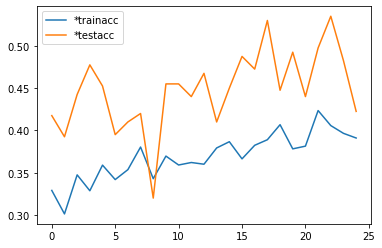

In [63]:
from matplotlib import pyplot
from sklearn.metrics import accuracy_score
pyplot.plot(history_aug.history['acc'], label='*trainacc')
pyplot.plot(history_aug.history['val_acc'], label='*testacc')
pyplot.legend()
pyplot.show()

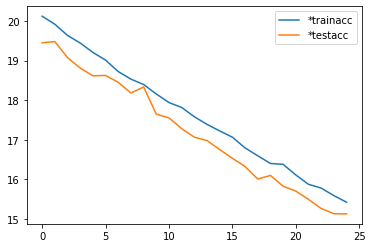

In [64]:
from matplotlib import pyplot
from sklearn.metrics import accuracy_score
pyplot.plot(history_aug.history['loss'], label='*trainacc')
pyplot.plot(history_aug.history['val_loss'], label='*testacc')
pyplot.legend()
pyplot.show()

In [65]:
img_path = 'C:/Users\VISNN\Downloads\Computer_Vision\Part-4-Flower'
import os
import cv2
file = 'Prediction - Flower.jpg'
#img_path=(os.path.join(img_path),file)
img_path=os.path.join(img_path,file)
img = cv2.imread(img_path)
img = cv2.cvtColor(img,cv2.COLOR_BGR2RGB)
img = cv2.resize(img,(227,227))

In [66]:
img.shape

(227, 227, 3)

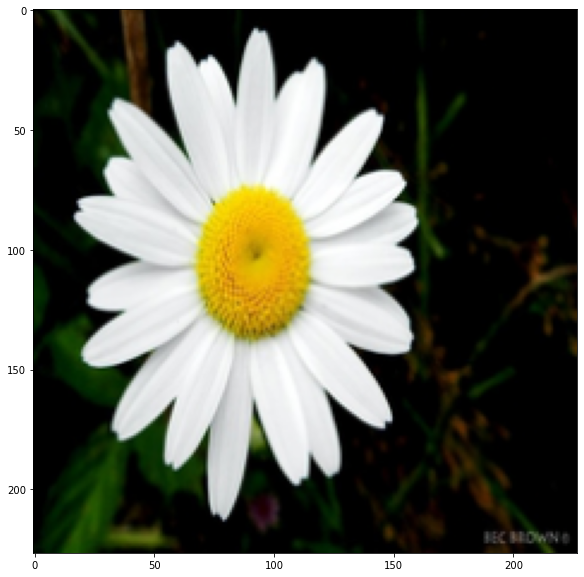

In [67]:
plt.figure(figsize=(10,10))
plt.imshow(img,cmap="gray")
plt.show()

In [68]:
print("Prediction for above image: ", np.argmax(model_P4_Alexnet.predict(img.reshape(1,227,227,3))))

Prediction for above image:  2


# Now let us use the transfer training:


In [75]:
batch_size = 16

IGD = ImageDataGenerator(
                        horizontal_flip=True,
                        vertical_flip=True,
                        rotation_range=20,width_shift_range=0.2,height_shift_range=0.2,shear_range=0.3,zoom_range=0.3,fill_mode='nearest')
#                         validation_split=0.3)

train_generator = IGD.flow(x=X_train_P4,
                          y=y_train_P4,
                          batch_size=batch_size,
                          shuffle=True,
                          seed=42)
#                           subset="training")

validation_generator = IGD.flow(x=X_val_P4,
                               y=y_val_P4,
                               batch_size=batch_size,
                               shuffle=True,
                               seed=42)
#                                subset="validation")

In [76]:
base_model = tf.keras.applications.VGG16(weights='imagenet',
                                            input_shape=(227,227,3),include_top=False)

In [77]:
base_model.trainable=False

In [78]:
from tensorflow.keras import models

model_P4_TL =models.Sequential()
model_P4_TL.add(base_model)
#model_P4_TL.add(tf.keras.layers.Conv2D(32,3,activation='relu'))
model_P4_TL.add(tf.keras.layers.Flatten())
model_P4_TL.add(tf.keras.layers.Dense(1024,activation='relu'))
model_P4_TL.add(tf.keras.layers.Dropout(0.5))
model_P4_TL.add(tf.keras.layers.Dense(17,activation='softmax'))
#model_P4_TL.add(tf.keras.layers.GlobalAveragePooling2D())

In [79]:
model_P4_TL.summary()

Model: "sequential_7"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
vgg16 (Functional)           (None, 7, 7, 512)         14714688  
_________________________________________________________________
flatten_4 (Flatten)          (None, 25088)             0         
_________________________________________________________________
dense_9 (Dense)              (None, 1024)              25691136  
_________________________________________________________________
dropout_5 (Dropout)          (None, 1024)              0         
_________________________________________________________________
dense_10 (Dense)             (None, 17)                17425     
Total params: 40,423,249
Trainable params: 25,708,561
Non-trainable params: 14,714,688
_________________________________________________________________


In [80]:
sgd=SGD(lr=0.0005)

model_P4_TL.compile(loss="categorical_crossentropy", metrics=['accuracy'],optimizer=sgd)

In [81]:
history_TL=model_P4_TL.fit(train_generator, epochs=25, steps_per_epoch=952//batch_size, validation_data=(validation_generator),validation_steps=408//batch_size)

Epoch 1/25
59/59 [==============================] - 106s 2s/step - batch: 29.0000 - size: 15.8644 - loss: 3.1005 - acc: 0.0652 - val_loss: 2.7258 - val_acc: 0.1475
Epoch 2/25
59/59 [==============================] - 105s 2s/step - batch: 29.0000 - size: 15.8644 - loss: 2.7709 - acc: 0.1442 - val_loss: 2.6188 - val_acc: 0.1875
Epoch 3/25
59/59 [==============================] - 105s 2s/step - batch: 29.0000 - size: 15.8644 - loss: 2.6727 - acc: 0.1496 - val_loss: 2.4943 - val_acc: 0.2325
Epoch 4/25
59/59 [==============================] - 205s 3s/step - batch: 29.0000 - size: 15.8644 - loss: 2.5500 - acc: 0.1859 - val_loss: 2.4064 - val_acc: 0.2875
Epoch 5/25
59/59 [==============================] - 113s 2s/step - batch: 29.0000 - size: 15.8644 - loss: 2.4673 - acc: 0.2425 - val_loss: 2.3548 - val_acc: 0.3650
Epoch 6/25
59/59 [==============================] - 109s 2s/step - batch: 29.0000 - size: 15.8644 - loss: 2.3951 - acc: 0.2543 - val_loss: 2.2431 - val_acc: 0.4200
Epoch 7/25
59/59

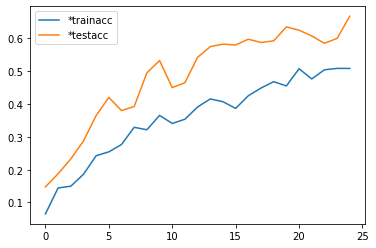

In [82]:
from matplotlib import pyplot
from sklearn.metrics import accuracy_score
pyplot.plot(history_TL.history['acc'], label='*trainacc')
pyplot.plot(history_TL.history['val_acc'], label='*testacc')
pyplot.legend()
pyplot.show()

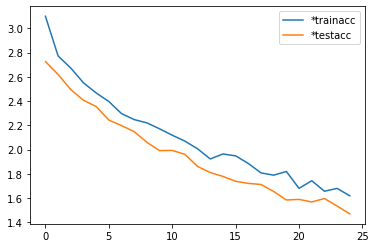

In [83]:
from matplotlib import pyplot
from sklearn.metrics import accuracy_score
pyplot.plot(history_TL.history['loss'], label='*trainacc')
pyplot.plot(history_TL.history['val_loss'], label='*testacc')
pyplot.legend()
pyplot.show()

In [84]:
img_path = 'C:/Users\VISNN\Downloads\Computer_Vision\Part-4-Flower'
import os
import cv2
file = 'Prediction - Flower.jpg'
#img_path=(os.path.join(img_path),file)
img_path=os.path.join(img_path,file)
img = cv2.imread(img_path)
img = cv2.cvtColor(img,cv2.COLOR_BGR2RGB)
img = cv2.resize(img,(227,227))

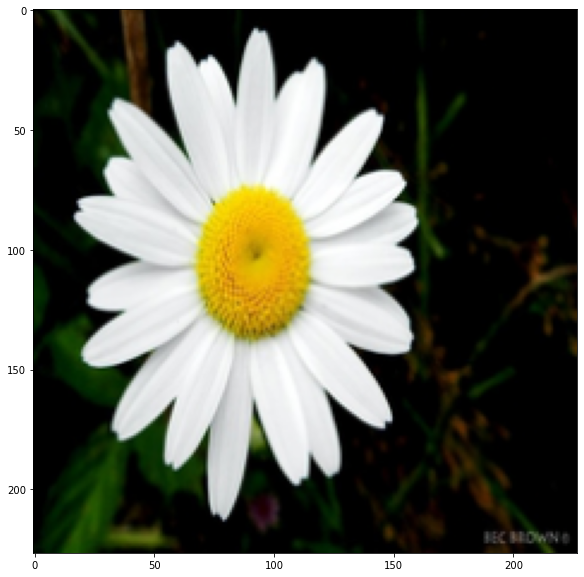

In [85]:
plt.figure(figsize=(10,10))
plt.imshow(img,cmap="gray")
plt.show()

In [86]:
print("Prediction for above image: ", np.argmax(model_P4_TL.predict(img.reshape(1,227,227,3))))

Prediction for above image:  2


The neural network model and the supervised learning model methodology for part-1 can be used for part-4 as well.
The highest accuracy will still be seen in the order as below:
1.) CNN
2.) NN
3.) Supervised Learning
The predictions obtained in CNN and NN are more accurate than those obtained in SVM in my case